In [1]:
import re, os, sys

import numpy as np
import pandas as pd
import torch
from PIL import Image

from preprocess import *

In [2]:
## codes below are for debugging preprocess.py
model_checkpoint = "koclip/koclip-base-pt"
processor = AutoProcessor.from_pretrained(model_checkpoint)
model = AutoModel.from_pretrained(model_checkpoint)

# paths
paths = {
    ## dataset & image path
    "train_path": "/kovar-vol/kovar/dataset/train.json",
    "test_path": "/kovar-vol/kovar/dataset/test.json",
    "image_path": "/kovar-vol/images",
}

In [3]:
get_dataset = JsonToDataset()
train_set = get_dataset(paths['test_path'])
len(train_set)

1216

In [4]:
def display_img(image_path):
    img = Image.open(image_path)
    img = ImageOps.exif_transpose(img)
    display(img)

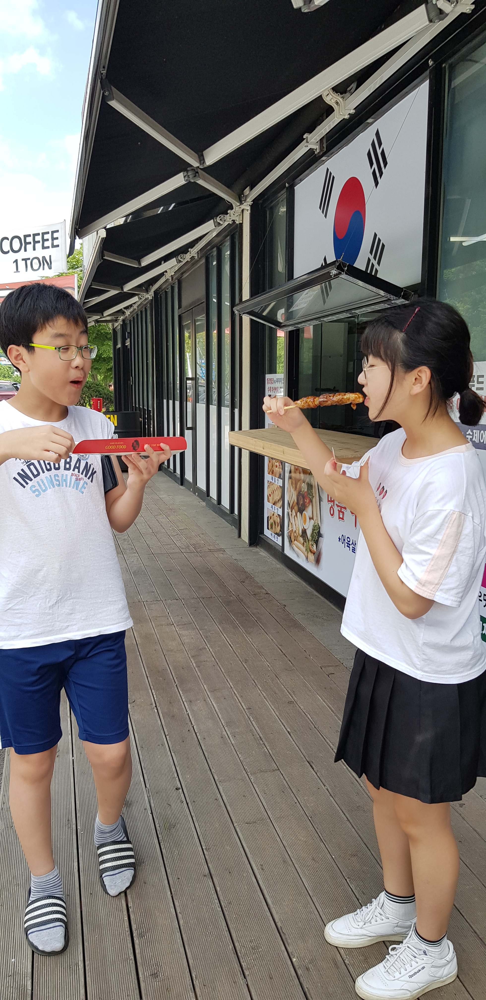

['사진 속 장면 후에 아이는 왼 손에 있는 꼬치 반쪽을 입에 한 번에 넣었다.[SEP]그 이유는 한 아이가 다른 아이에게 맛있는지 물었기 때문이다.',
 '사진 속 장면 후에 아이는 왼 손에 있는 꼬치 반쪽을 입에 한 번에 넣었다.[SEP]그 이유는 그런데 새로운 길로 가니 더 빨리 도착할 수 있었기 때문이다.',
 '사진 속 장면 후에 아이는 왼 손에 있는 꼬치 반쪽을 입에 한 번에 넣었다.[SEP]그 이유는 한 아이가 다른 아이에게 한 입만 달라고 말했기 때문이다.']

In [6]:
sample = train_set[305]

display_img(sample['image_path'])
sample['input_prompt']

- 바닐라: 388/1216
- 문두에 cls 토큰 추가: 387/1216
- 이미지 트랜스폼
    - 리사이즈 & 노말라이즈: 337/1216
    - 정규화만: 388/1216

<br>

- 프롬프트 엔지니어링
    - NSP(obs1. 그 이후 obs2. 그 이유는 hypN했기 때문이다.): 396/1216
    - MLM(obs1. 그리고 hypN. 그 결과 obs2): 389/1216
    - No Obs1(사진 속 장면 후에 obs2. 그 이유는 hypN했기 때문이다.)
    